# Todo List

In [1]:
'''
1. Empty와 나머지 class의 차이로 noise를 추출하고 시각화 해보기(가장 간단한 방식)
2. 추출한 walk_noise로 sit generator 학습시키고, real, fake 를 시각화해보기
3. fake로 사전학습된 모델에 돌려서 클래스 뽑아보기

%% NOTICE %%
가우시안 노이즈 z가 아닌 추출한 노이즈를 뽑는것이 의미가 있을지?
-> 테스트 단계에서 테스트 도메인 노이즈가 제너레이터에 들어갔을때
   그 특성이 반영된다면 의미가 있음
-> 증명필요
'''

'\n1. Empty와 나머지 class의 차이로 noise를 추출하고 시각화 해보기(가장 간단한 방식)\n2. 추출한 noise로 generator 학습시키고, real, fake 를 시각화해보기\n3. fake로 사전학습된 모델에 돌려서 클래스 뽑아보기\n\n%% NOTICE %%\n가우시안 노이즈 z가 아닌 추출한 노이즈를 뽑는것이 의미가 있을지?\n-> 테스트 단계에서 테스트 도메인 노이즈가 제너레이터에 들어갔을때\n   그 특성이 반영된다면 의미가 있음\n-> 증명필요\n'

1. Empty와 나머지 class의 차이로 noise를 추출하고 시각화 해보기(가장 간단한 방식)

In [1]:
'''
    Load CSI Data
'''
from runner.utils import get_config
from dataloader.dataset import CSIDataset

cfg = get_config("config.yaml")

# Data load
data = CSIDataset(cfg["train_dataset_path"], num_support=5, num_query=10, win_size=100)

sample = data.__getitem__(0)
classes = list(sample.keys())

In [2]:
print(classes)
print(sample['empty']['support'].shape)

['empty', 'sit', 'stand', 'walk']
(5, 100, 64)


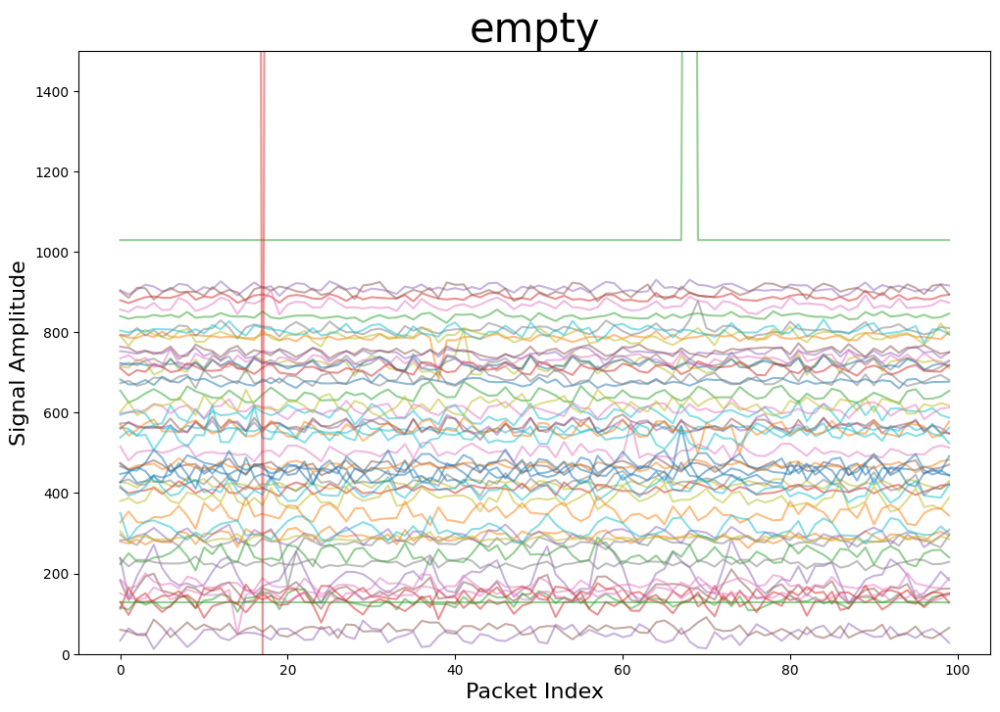

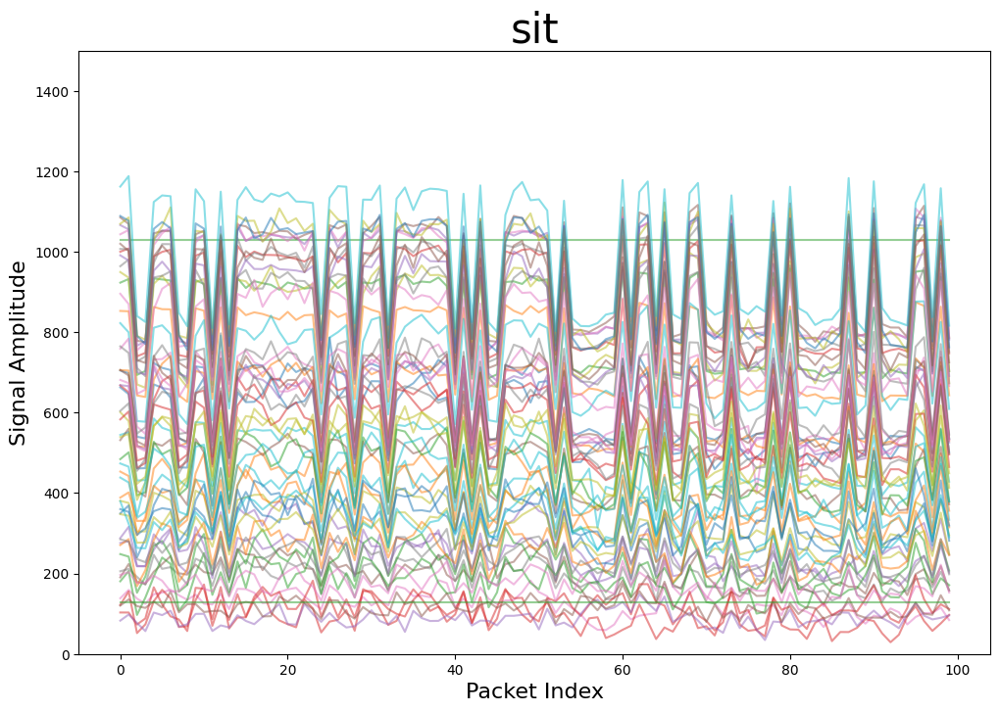

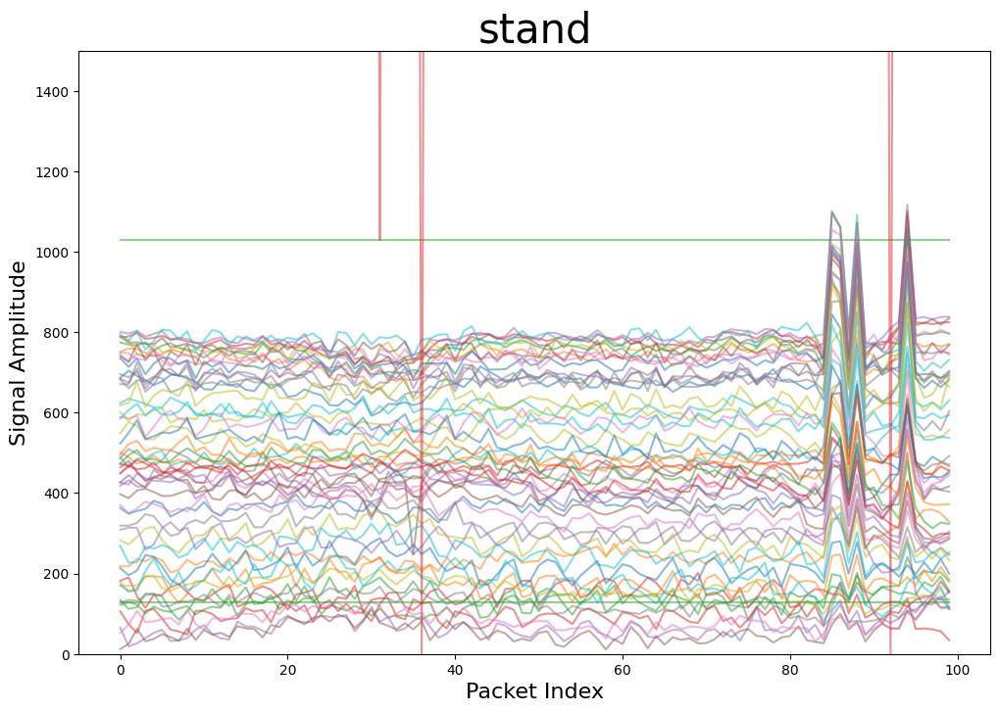

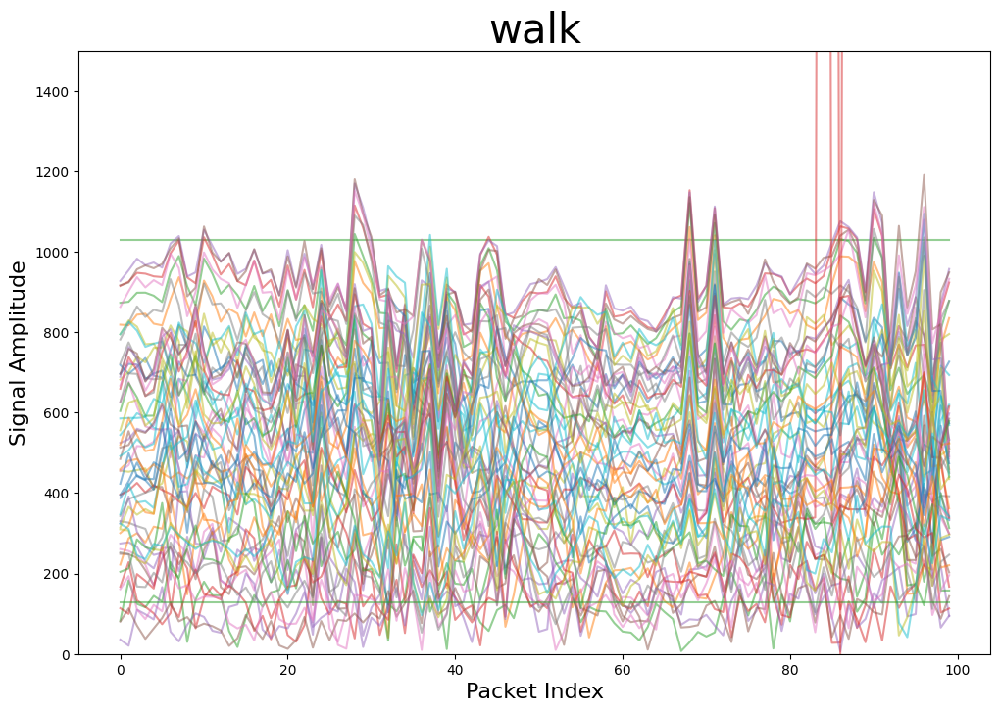

In [3]:
'''
Original Data Visualization
'''
from plot.amp_plot import amp_plotter

for label in classes:
    amp_plotter(sample[label]['support'][0], num_subc=64,
                label=label, filter=True, filter_val = 1500)

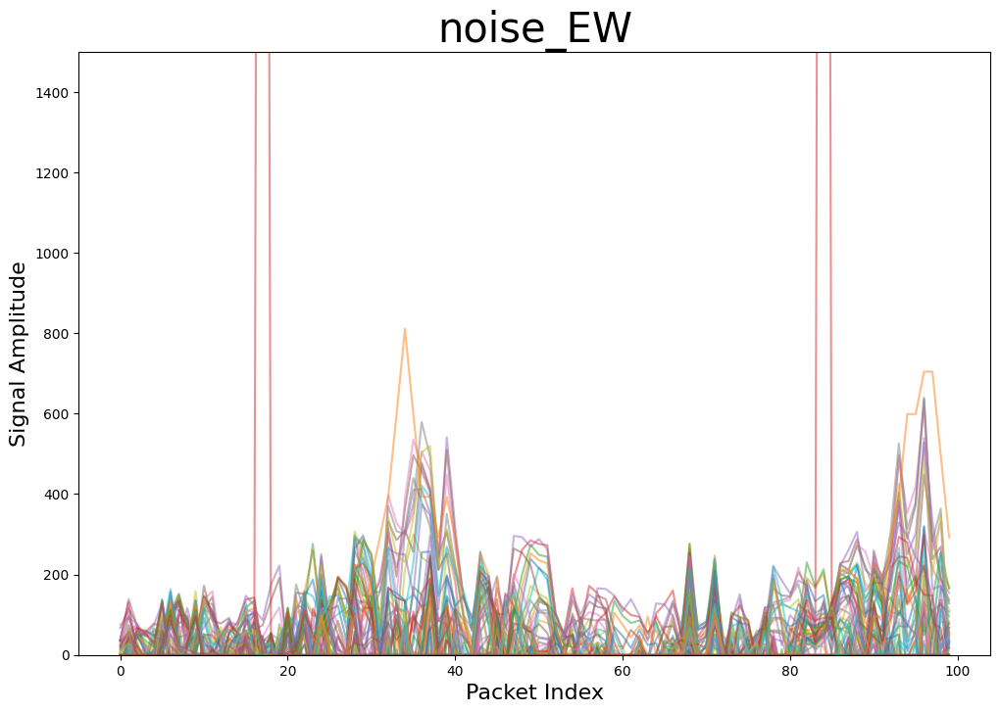

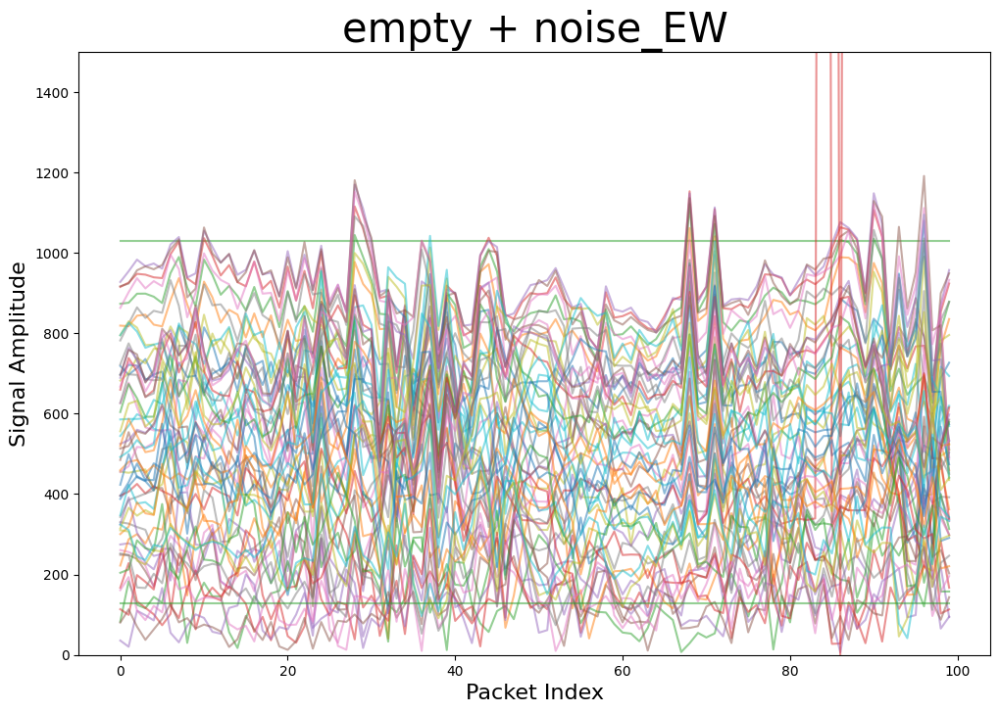

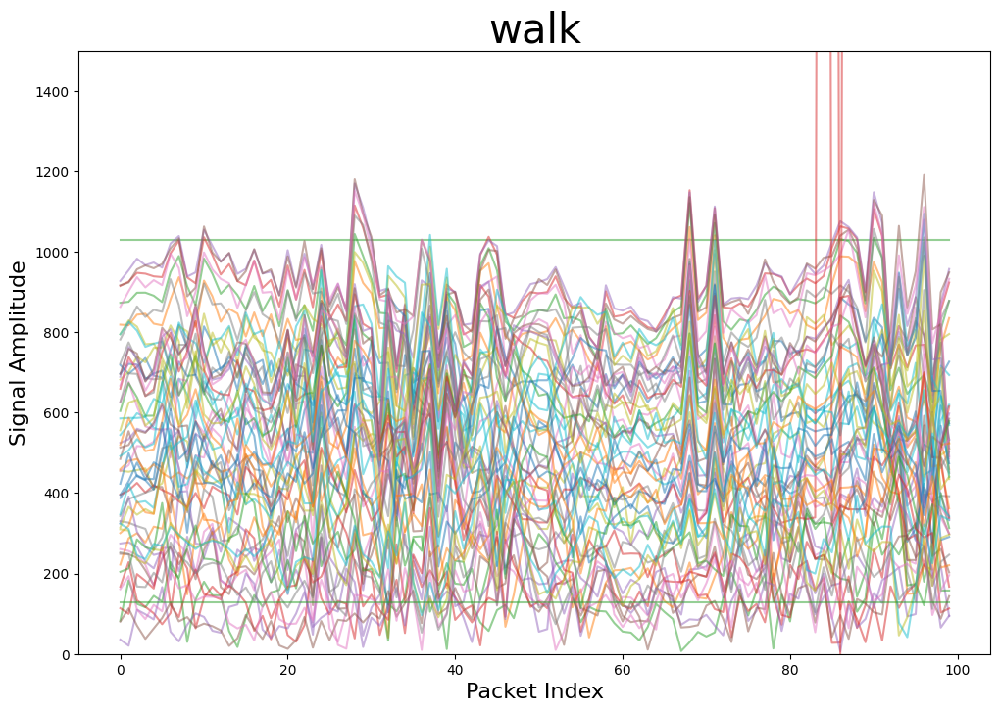

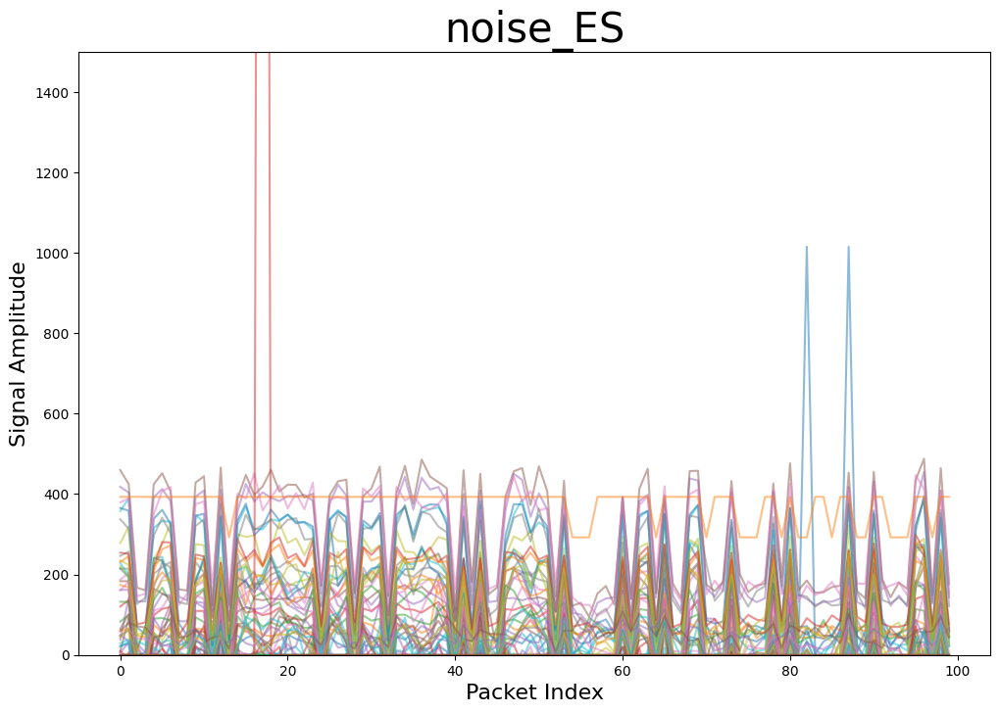

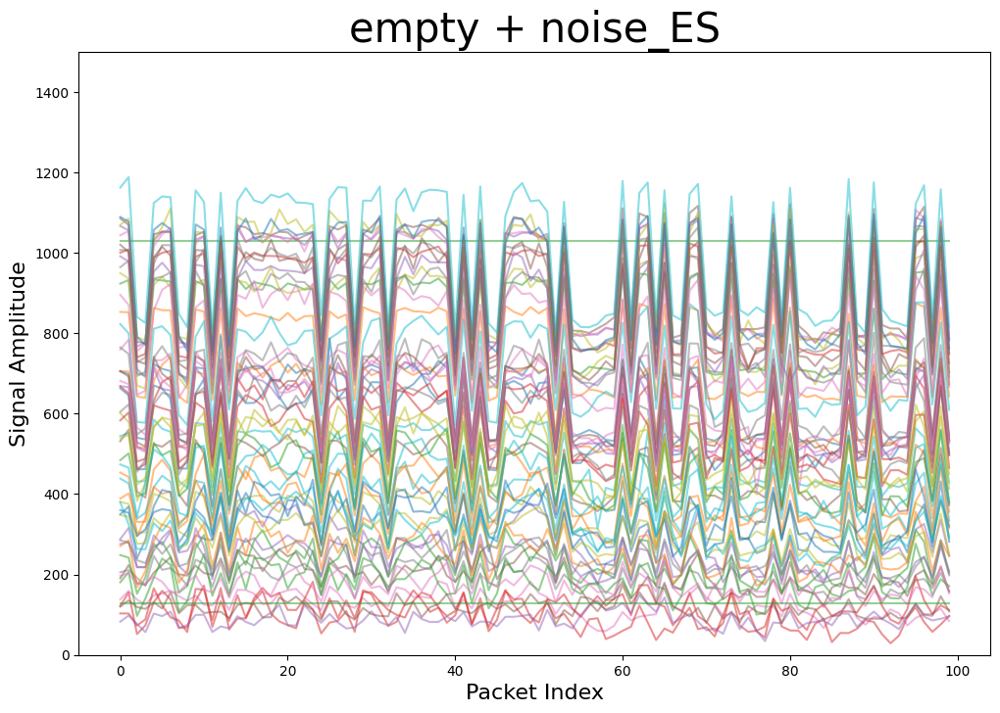

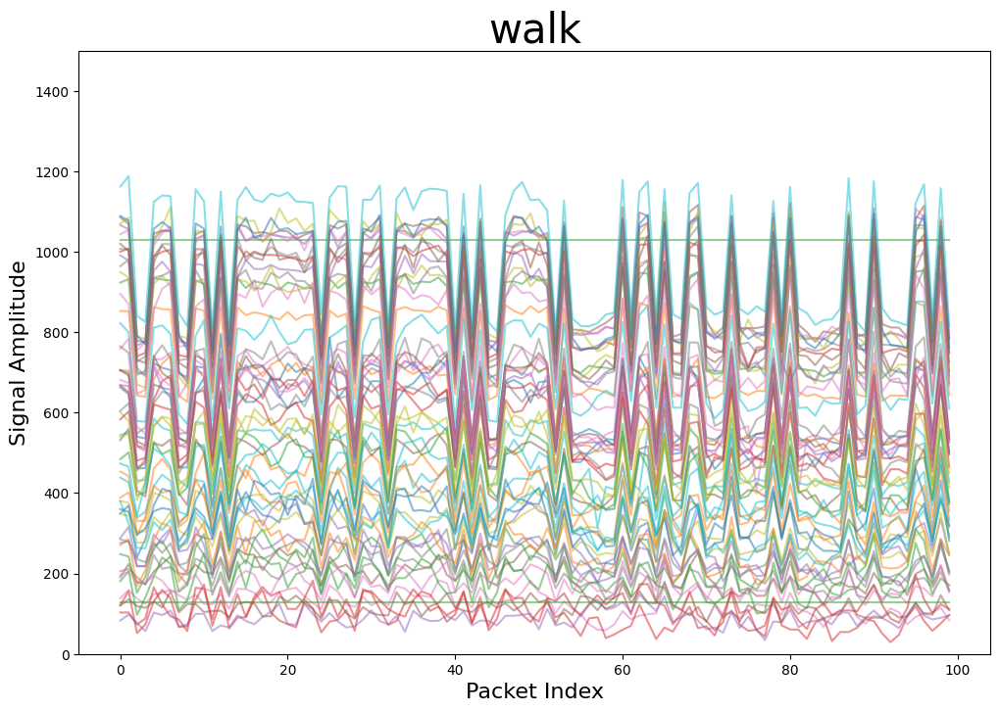

In [4]:
'''
Get noise (Matrix subtraction)
'''
noise_A = sample['walk']['support'][0] - sample['empty']['support'][0]
noise_B = sample['sit']['support'][0] - sample['empty']['support'][0]

amp_plotter(noise_A, num_subc=64,
                label='noise_EW', filter=True, filter_val = 1500)
amp_plotter(sample['empty']['support'][0]+noise_A, num_subc=64,
                label='empty + noise_EW', filter=True, filter_val = 1500)
amp_plotter(sample['walk']['support'][0], num_subc=64,
                label='walk', filter=True, filter_val = 1500)

amp_plotter(noise_B, num_subc=64,
                label='noise_ES', filter=True, filter_val = 1500)
amp_plotter(sample['empty']['support'][0]+noise_B, num_subc=64,
                label='empty + noise_ES', filter=True, filter_val = 1500)
amp_plotter(sample['sit']['support'][0], num_subc=64,
                label='walk', filter=True, filter_val = 1500)


# Fake Data Visualization

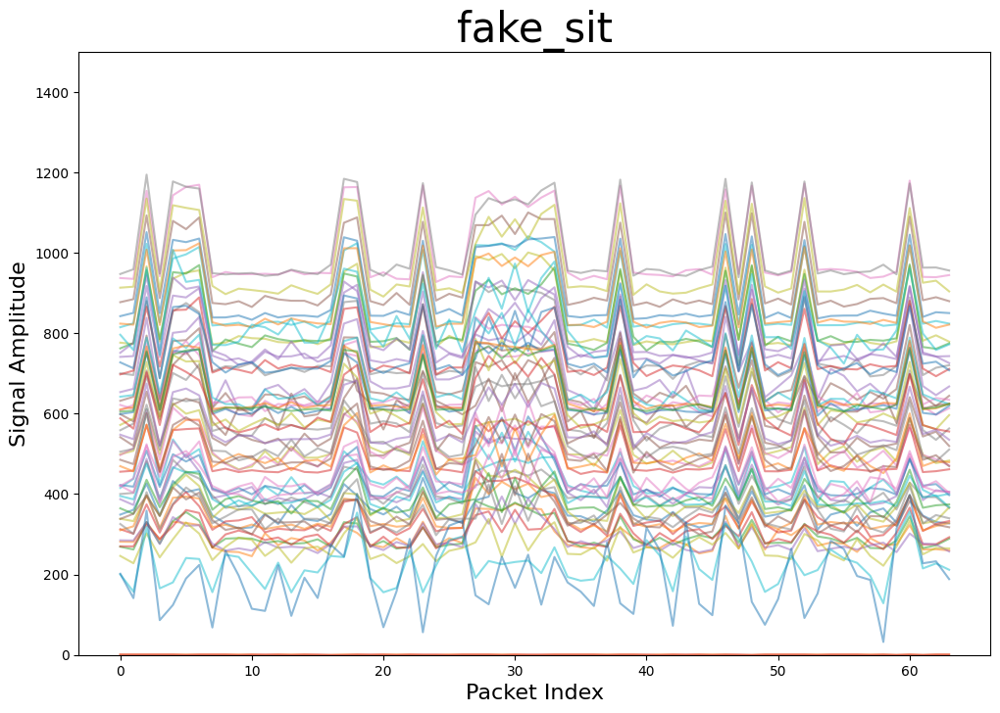

[[7.80222840e+03 5.22553673e+03 5.11960047e+03 ... 1.00000000e+00
  8.17600000e+03 1.00000000e+00]
 [7.80222840e+03 5.22453673e+03 5.12060047e+03 ... 1.00000000e+00
  8.17600000e+03 1.00000000e+00]
 [7.80222840e+03 5.22453673e+03 5.11960047e+03 ... 1.00000000e+00
  8.17600000e+03 1.00000000e+00]
 ...
 [7.80222840e+03 5.22553673e+03 5.11960047e+03 ... 0.00000000e+00
  8.17500000e+03 0.00000000e+00]
 [7.80222840e+03 5.22453673e+03 5.11960047e+03 ... 1.00000000e+00
  8.17600000e+03 1.00000000e+00]
 [7.80322840e+03 5.22453673e+03 5.12060047e+03 ... 1.00000000e+00
  8.17600000e+03 1.00000000e+00]]


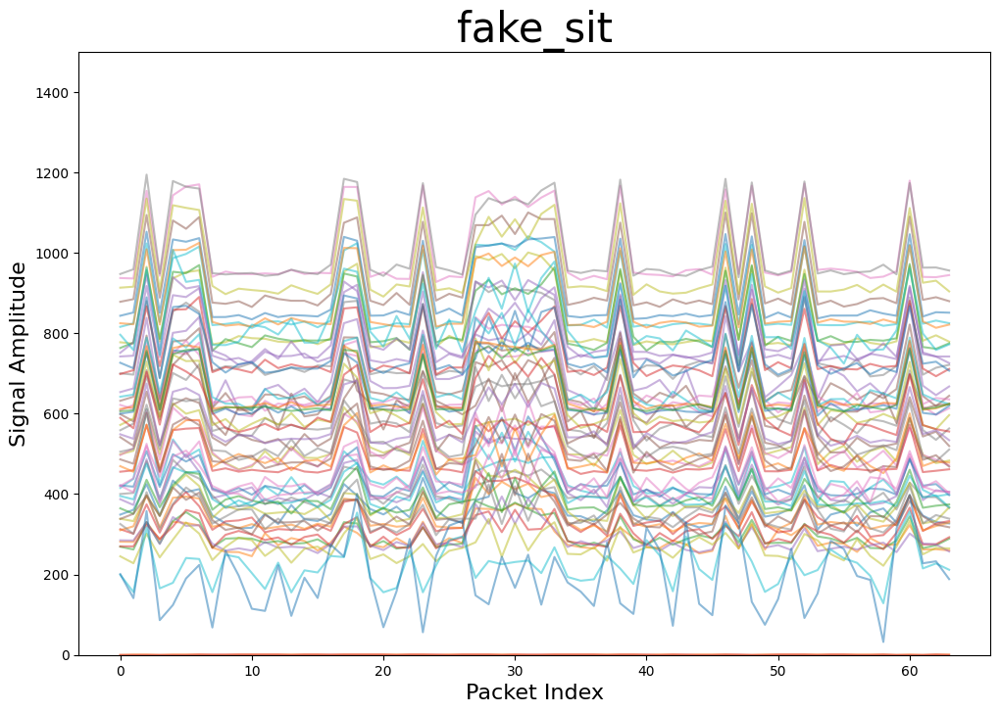

[[7.80322840e+03 5.22553673e+03 5.12060047e+03 ... 0.00000000e+00
  8.17500000e+03 0.00000000e+00]
 [7.80322840e+03 5.22553673e+03 5.12060047e+03 ... 1.00000000e+00
  8.17500000e+03 0.00000000e+00]
 [7.80322840e+03 5.22553673e+03 5.11960047e+03 ... 1.00000000e+00
  8.17500000e+03 0.00000000e+00]
 ...
 [7.80322840e+03 5.22553673e+03 5.11960047e+03 ... 0.00000000e+00
  8.17500000e+03 0.00000000e+00]
 [7.80222840e+03 5.22553673e+03 5.11960047e+03 ... 1.00000000e+00
  8.17600000e+03 1.00000000e+00]
 [7.80322840e+03 5.22553673e+03 5.12060047e+03 ... 1.00000000e+00
  8.17600000e+03 0.00000000e+00]]


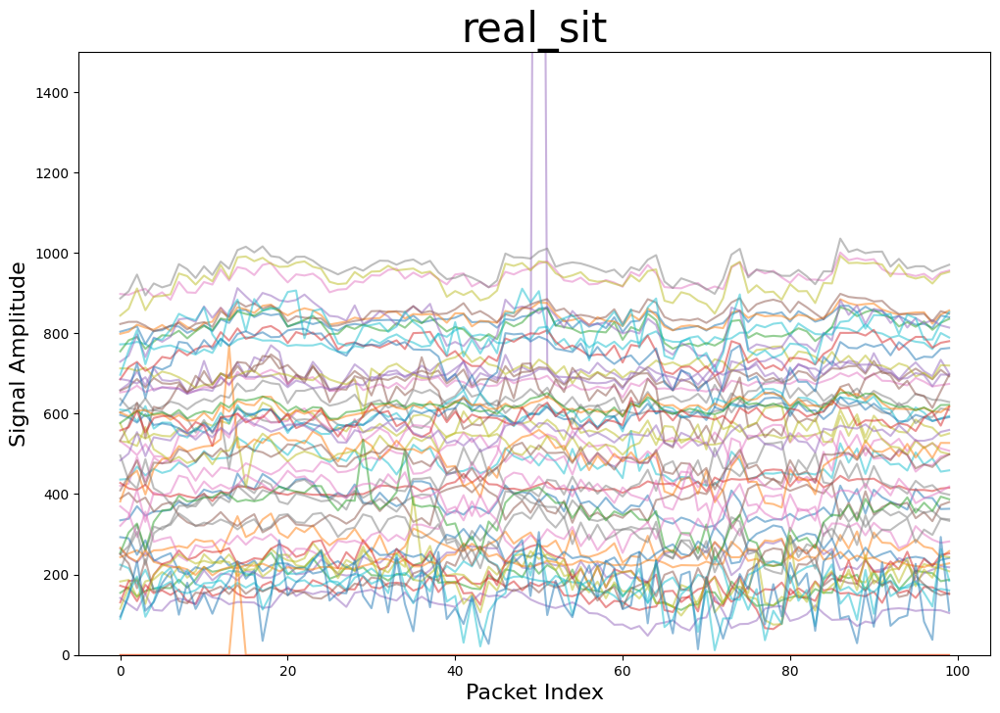

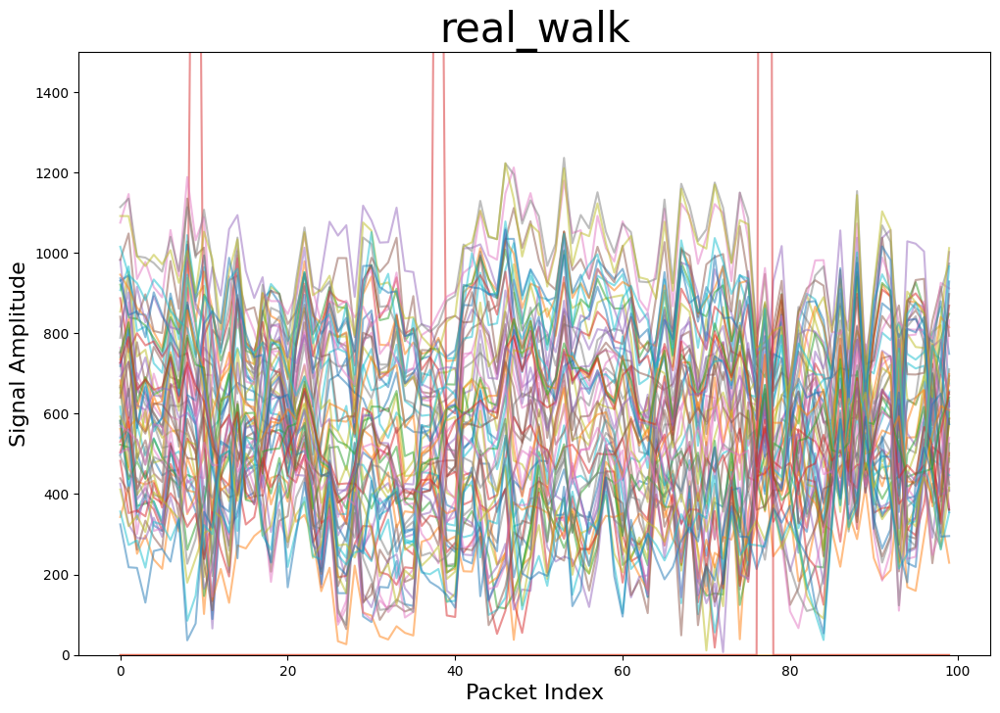

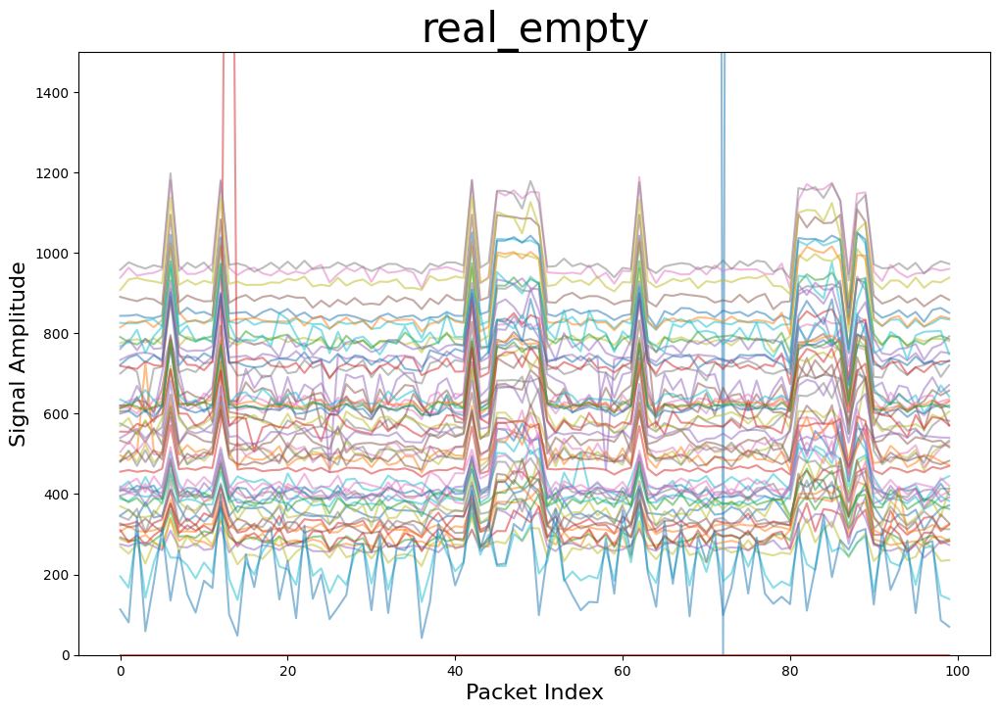

In [7]:
from plot.amp_plot import amp_plotter
import numpy as np
from runner.utils import get_config
from dataloader.dataset import CSIDataset

cfg = get_config("config.yaml")

# Data load
data = CSIDataset(cfg["test_dataset_path"], num_support=5, num_query=10, win_size=100)

sample = data.__getitem__(0)
classes = list(sample.keys())

fake_data = np.load('./csi_dataset/fake_data/fake_sit.npy')

for i in range(2):
    amp_plotter(fake_data[i], num_subc=64,
                label='fake_sit', filter=True, filter_val = 1500)
    print(fake_data[i])
    

amp_plotter(sample['sit']['support'][0], num_subc=64,
            label='real_sit', filter=True, filter_val = 1500)

amp_plotter(sample['walk']['support'][0], num_subc=64,
            label='real_walk', filter=True, filter_val = 1500)

amp_plotter(sample['empty']['support'][0], num_subc=64,
            label='real_empty', filter=True, filter_val = 1500)